#### 加载音频文件   librosa

In [1]:
import librosa

In [2]:
audio_path = './demo/clean-lh.mp3'
x , sr = librosa.load(audio_path)
'''将音频时间序列作为numpy数组返回，默认采样率（sr）为22KHZ mono。
可以更改以44.1KHz重新采样：librosa.load(audio_path, sr=44100)'''
print(type(x), type(sr))
print(x.shape, sr)

<class 'numpy.ndarray'> <class 'int'>
(6090912,) 22050


#### 播放音频  IPython.display.Audio

In [3]:
import IPython.display as ipd 
ipd.Audio(audio_path)

#### 可视化音频 librosa.display

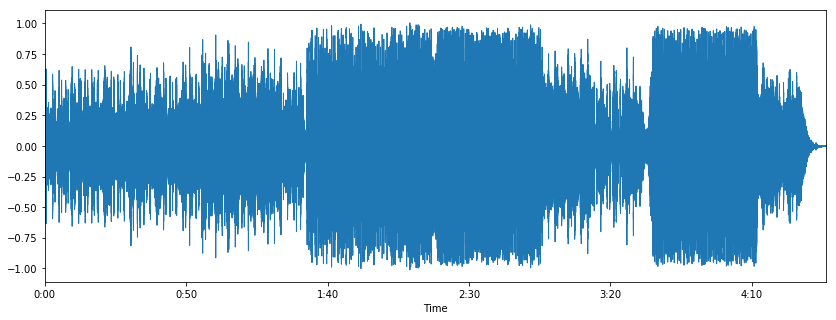

In [4]:
#波形 librosa.display.waveplot
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display

plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

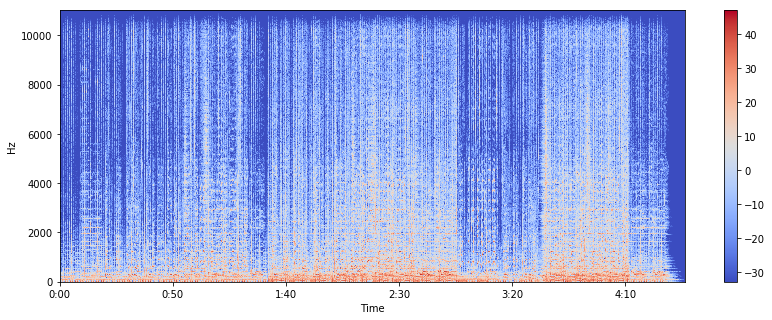

In [5]:
#谱图 librosa.display.specshow
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

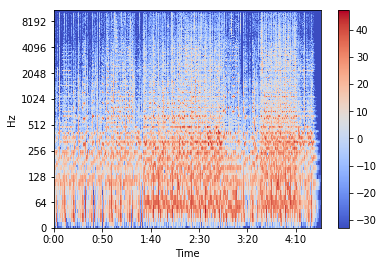

In [6]:
# 纵轴表示频率（从0到10kHz），横轴表示剪辑的时间。可以将频率轴转换为对数轴。
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

#### 写音频 librosa.output

In [7]:
librosa.output.write_wav('./demo/newclean-lh.wav', x, sr)

#### 创建音频信号 IPython.display.Audio

In [8]:
import numpy as np

sr = 22050                                       # sample rate
T = 5.0                                          # seconds
t = np.linspace(0, T, int(T*sr), endpoint=False) # time variable
x = 0.5*np.sin(2*np.pi*220*t)                    # pure sine wave at 220 Hz

ipd.Audio(x, rate=sr)                            # load a NumPy array
# librosa.output.write_wav('./demo/tone_220.wav', x, sr)

#### 特征提取

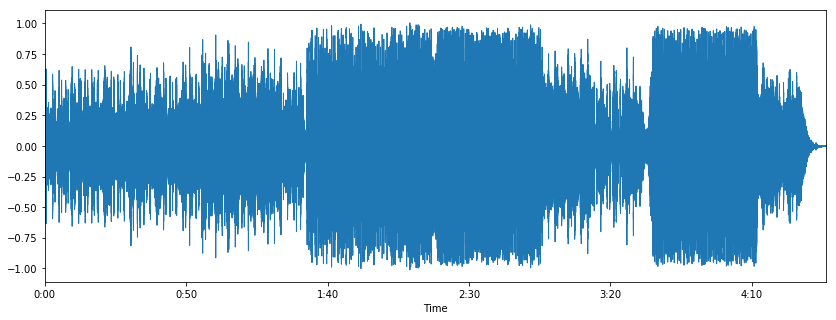

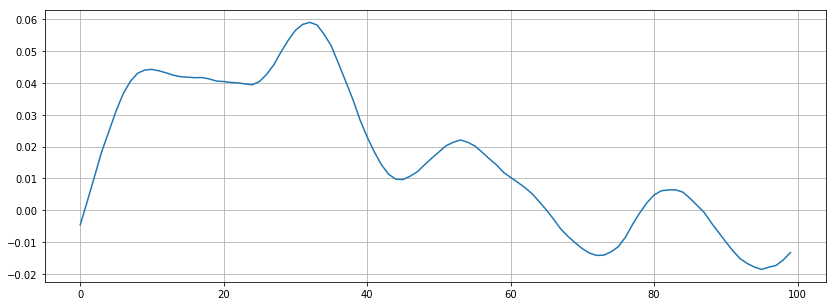

In [9]:
# 过零率 librosa.zero_crossings
# 该特征在语音识别和音乐信息检索中都被大量使用。对于像金属和岩石那样的高冲击声，它通常具有更高的值。
x, sr = librosa.load('./demo/clean-lh.mp3')       # Load the signal

plt.figure(figsize=(14, 5))                       # Plot the signal
librosa.display.waveplot(x, sr=sr)

n0 = 9000                                         # Zooming in
n1 = 9100
plt.figure(figsize=(14, 5))
plt.plot(x[n0:n1])
plt.grid()

In [10]:
# 似乎有4个过零点，可用librosa验证。
zero_crossings = librosa.zero_crossings(x[n0:n1], pad=False)
print(sum(zero_crossings))

4


(11897,)


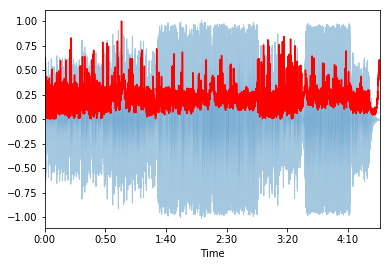

In [11]:
# 光谱质心 librosa.feature.spectral_centroid
# 指示声音的“质心”位于何处，并计算为声音中存在的频率的加权平均值。
'''如果有两首歌曲，一首来自布鲁斯类型，另一首属于金属。
与长度相同的布鲁斯流派歌曲相比，金属歌曲在最后有更多的频率。
因此，布鲁斯歌曲的光谱质心将位于其光谱中间附近，而金属歌曲的光谱质心将朝向它的末端。'''
import sklearn

spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
print(spectral_centroids.shape)

frames = range(len(spectral_centroids))        # Computing the time variable for visualization
t = librosa.frames_to_time(frames)

def normalize(x, axis=0):                      # Normalising the spectral centroid for visualisation            
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

librosa.display.waveplot(x, sr=sr, alpha=0.4)  # Plotting the Spectral Centroid along the waveform
plt.plot(t, normalize(spectral_centroids), color='r')

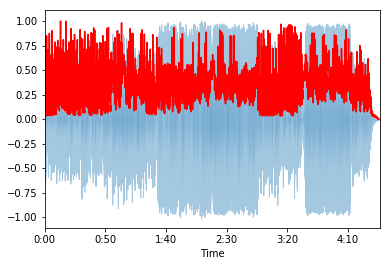

In [12]:
# 光谱衰减 librosa.feature.spectral_rolloff
# 信号形状的度量, 计算信号中每帧的滚降系数.
spectral_rolloff = librosa.feature.spectral_rolloff(x+0.01, sr=sr)[0]
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='r')

(20, 11897)


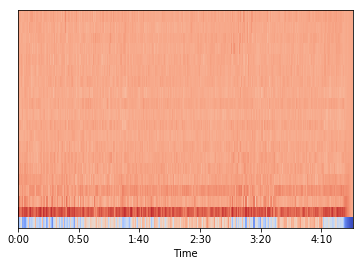

In [13]:
# 梅尔频率倒谱系数（MFCC） librosa.feature.mfcc
# 是一小组特征（通常约10-20），其简明地描述了频谱包络的整体形状，它模拟了人声的特征。
mfccs = librosa.feature.mfcc(x, sr=sr)
print (mfccs.shape)

librosa.display.specshow(mfccs, sr=sr, x_axis='time')

[ 6.44576992e-16  1.62129703e-14 -2.54678462e-16 -7.38200792e-15
  3.75611303e-17 -4.08036124e-15 -2.88595462e-16 -1.18695971e-15
 -1.79731175e-15  1.36291378e-15 -2.81925912e-15  4.44966414e-16
  2.61925660e-15 -1.52475734e-16  4.34740921e-17  4.78090198e-16
 -2.58432242e-16 -4.65970318e-16 -1.11050298e-17 -4.57237938e-16]
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


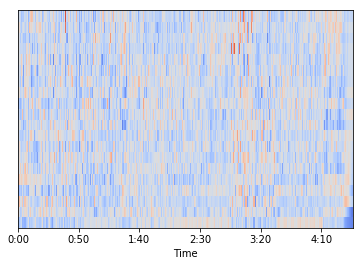

In [14]:
# 上面mfcc计算了超过11897帧的20个MFCC。
# 还可以执行特征缩放，使得每个系数维度具有零均值和单位方差：
mfccs = sklearn.preprocessing.scale(mfccs, axis=1)
print(mfccs.mean(axis=1))
print(mfccs.var(axis=1))

librosa.display.specshow(mfccs, sr=sr, x_axis='time')

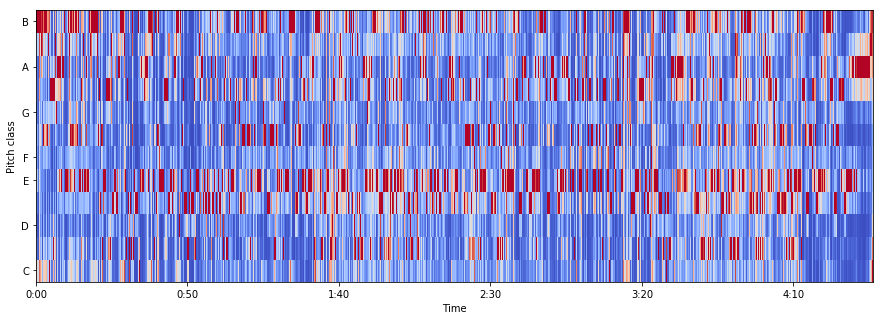

In [15]:
# 色度频率 librosa.feature.chroma_stft
# 整个频谱被投影到12个区间，代表音乐八度音的12个不同的半音（或色度）

x, sr = librosa.load('./demo/clean-lh.mp3')
hop_length = 512
chromagram = librosa.feature.chroma_stft(x, sr=sr, hop_length=hop_length)

plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')